In [ ]:
# Albumentations Mask Debugging
# ============================
# This notebook helps debug mask processing issues in Albumentations

import os
import sys
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image
import albumentations as A

# Add project root to path
project_root = Path().resolve().parents[0]
sys.path.append(str(project_root))

# Set paths - adjust these to your environment
processed_dir = project_root / "data" / "processed"
# train_dir = processed_dir / "Train"
train_dir = processed_dir / "Train" / "augmented"
# orig_img_dir = train_dir / "color"
# mask_dir = train_dir / "label"

# orig_img_dir = train_dir / "resized"
# mask_dir = train_dir / "resized_label"

orig_img_dir = train_dir / "images"
mask_dir = train_dir / "masks"

# Helper functions for visualization
def display_image_and_mask(image, mask, title="Image and Mask"):
    """Display an image and its mask side by side with proper coloring."""
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
    
    # Display image
    ax1.imshow(image)
    ax1.set_title("Original Image")
    ax1.axis('off')
    
    # Create a colored visualization of mask
    colored_mask = np.zeros((*mask.shape, 3), dtype=np.uint8)
    # Set colors by class
    colored_mask[mask == 0] = [0, 0, 0]      # Background - Black
    colored_mask[mask == 1] = [255, 0, 0]    # Cat - Red
    colored_mask[mask == 2] = [0, 255, 0]    # Dog - Green
    colored_mask[mask == 255] = [255, 255, 255]  # Border - White
    
    # Display colored mask
    ax2.imshow(colored_mask)
    ax2.set_title(f"Mask (Unique values: {np.unique(mask)})")
    ax2.axis('off')
    
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()
    
    # Print mask value counts
    values, counts = np.unique(mask, return_counts=True)
    print(f"Mask unique values and counts:")
    for val, count in zip(values, counts):
        print(f"  Value {val}: {count} pixels ({count/(mask.shape[0]*mask.shape[1])*100:.2f}%)")

def compare_masks(original_mask, processed_mask, title="Mask Comparison"):
    """Compare original and processed masks side by side."""
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
    
    # Create colored visualizations
    def color_mask(mask):
        colored = np.zeros((*mask.shape, 3), dtype=np.uint8)
        colored[mask == 0] = [0, 0, 0]      # Background - Black
        colored[mask == 1] = [255, 0, 0]    # Cat - Red
        colored[mask == 2] = [0, 255, 0]    # Dog - Green
        colored[mask == 255] = [255, 255, 255]  # Border - White
        return colored
    
    # Display original mask
    ax1.imshow(color_mask(original_mask))
    ax1.set_title(f"Original Mask\nValues: {np.unique(original_mask)}")
    ax1.axis('off')
    
    # Display processed mask
    ax2.imshow(color_mask(processed_mask))
    ax2.set_title(f"Processed Mask\nValues: {np.unique(processed_mask)}")
    ax2.axis('off')
    
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()
    
    # Check if masks are identical
    if np.array_equal(original_mask, processed_mask):
        print("✅ Masks are identical")
    else:
        print("❌ Masks differ")
        # Find where they differ
        diff_locations = np.where(original_mask != processed_mask)
        diff_count = len(diff_locations[0])
        print(f"  Different at {diff_count} pixels ({diff_count/(original_mask.shape[0]*original_mask.shape[1])*100:.2f}%)") 
        if diff_count > 0:
            print(f"  Original values at diff locations: {np.unique(original_mask[diff_locations])}")
            print(f"  Processed values at diff locations: {np.unique(processed_mask[diff_locations])}")



In [21]:
# 1. Find a cat and dog image for testing
# =======================================

# Find a cat image
cat_images = []
for img_path in orig_img_dir.glob("*.jpg"):
    mask_path = mask_dir / f"{img_path.stem}.png"
    if mask_path.exists():
        mask = np.array(Image.open(mask_path))
        if 1 in np.unique(mask):  # Contains cat class
            cat_images.append((img_path, mask_path))
            if len(cat_images) >= 32:
                break

# Find a dog image
dog_images = []
for img_path in orig_img_dir.glob("*.jpg"):
    mask_path = mask_dir / f"{img_path.stem}.png"
    if mask_path.exists():
        mask = np.array(Image.open(mask_path))
        if 2 in np.unique(mask):  # Contains dog class
            dog_images.append((img_path, mask_path))
            if len(dog_images) >= 32:
                break

print(f"Found {len(cat_images)} cat images and {len(dog_images)} dog images for testing")



Found 32 cat images and 32 dog images for testing


Image shape: (512, 512, 3), dtype: uint8
Mask shape: (512, 512), dtype: uint8


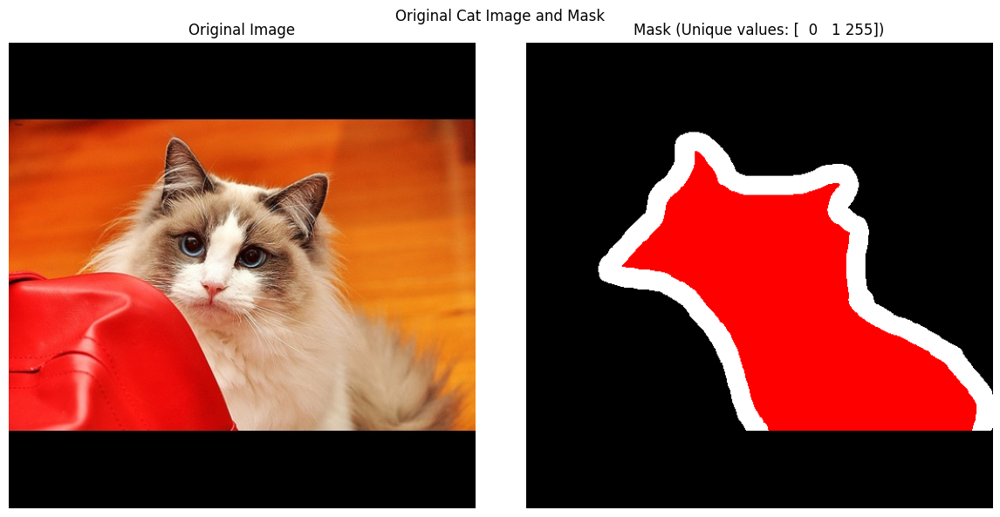

Mask unique values and counts:
  Value 0: 186129 pixels (71.00%)
  Value 1: 54697 pixels (20.87%)
  Value 255: 21318 pixels (8.13%)
Image shape: (512, 512, 3), dtype: uint8
Mask shape: (512, 512), dtype: uint8


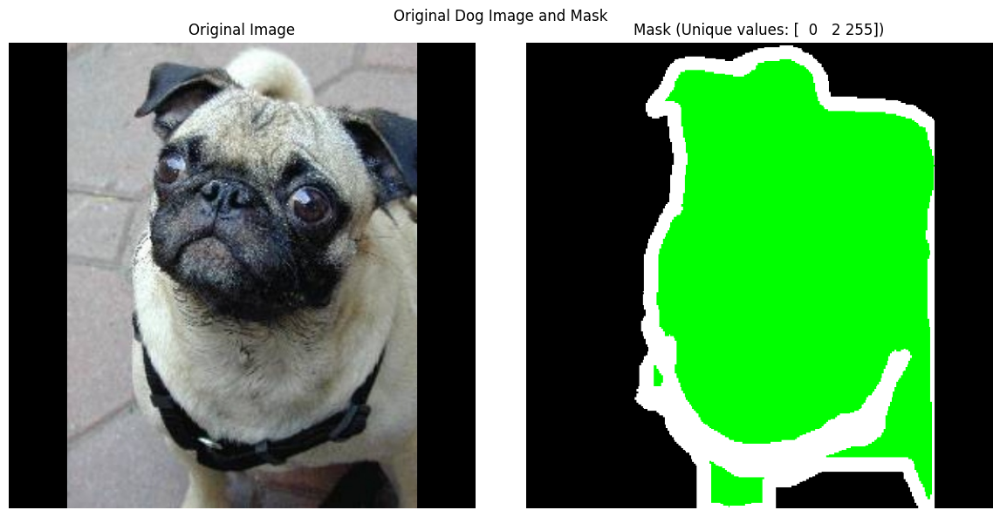

Mask unique values and counts:
  Value 0: 123730 pixels (47.20%)
  Value 2: 107654 pixels (41.07%)
  Value 255: 30760 pixels (11.73%)


In [22]:
# 2. Load and visualize an original image and mask
# ===============================================

cat_rand_idx = np.random.randint(0, len(cat_images))
dog_rand_idx = np.random.randint(0, len(dog_images))

# Choose a cat image
if cat_images:
    cat_img_path, cat_mask_path = cat_images[cat_rand_idx]
    
    # Load with OpenCV (BGR)
    cat_img_cv = cv2.imread(str(cat_img_path))
    # Convert BGR to RGB
    cat_img_rgb = cv2.cvtColor(cat_img_cv, cv2.COLOR_BGR2RGB)
    
    # Load mask with PIL
    cat_mask_pil = Image.open(cat_mask_path)
    cat_mask = np.array(cat_mask_pil)
    
    # Visualize
    print(f"Image shape: {cat_img_rgb.shape}, dtype: {cat_img_rgb.dtype}")
    print(f"Mask shape: {cat_mask.shape}, dtype: {cat_mask.dtype}")
    display_image_and_mask(cat_img_rgb, cat_mask, "Original Cat Image and Mask")

# Choose a dog image
if dog_images:
    dog_img_path, dog_mask_path = dog_images[dog_rand_idx]
    
    # Load with OpenCV (BGR)
    dog_img_cv = cv2.imread(str(dog_img_path))
    # Convert BGR to RGB
    dog_img_rgb = cv2.cvtColor(dog_img_cv, cv2.COLOR_BGR2RGB)
    
    # Load mask with PIL
    dog_mask_pil = Image.open(dog_mask_path)
    dog_mask = np.array(dog_mask_pil)
    
    # Visualize
    print(f"Image shape: {dog_img_rgb.shape}, dtype: {dog_img_rgb.dtype}")
    print(f"Mask shape: {dog_mask.shape}, dtype: {dog_mask.dtype}")
    display_image_and_mask(dog_img_rgb, dog_mask, "Original Dog Image and Mask")



Comparing mask loading methods for: /home/ulixes/segmentation_cv/data_augmentation/data/processed/Train/resized_label/British_Shorthair_125.png
PIL load - unique values: [  0   1 255], dtype: uint8
OpenCV load - unique values: [  0   1 255], dtype: uint8
OpenCV grayscale - unique values: [  0   1 255], dtype: uint8


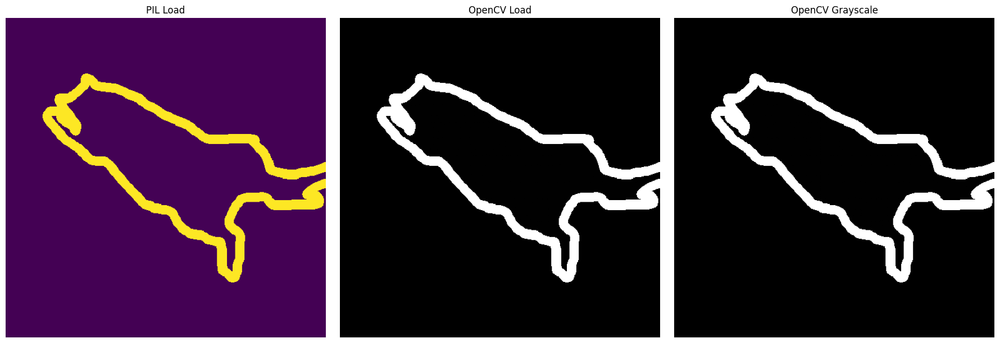

In [23]:
# 3. Test different mask loading methods
# =====================================

def compare_mask_loading_methods(mask_path):
    """Compare different methods of loading a mask."""
    print(f"Comparing mask loading methods for: {mask_path}")
    
    # Method 1: PIL direct
    mask_pil = np.array(Image.open(mask_path))
    
    # Method 2: OpenCV imread
    mask_cv = cv2.imread(str(mask_path), cv2.IMREAD_UNCHANGED)
    
    # Method 3: OpenCV with grayscale flag
    mask_cv_gray = cv2.imread(str(mask_path), cv2.IMREAD_GRAYSCALE)
    
    # Display results
    print(f"PIL load - unique values: {np.unique(mask_pil)}, dtype: {mask_pil.dtype}")
    print(f"OpenCV load - unique values: {np.unique(mask_cv) if mask_cv is not None else 'None'}, dtype: {mask_cv.dtype if mask_cv is not None else 'None'}")
    print(f"OpenCV grayscale - unique values: {np.unique(mask_cv_gray) if mask_cv_gray is not None else 'None'}, dtype: {mask_cv_gray.dtype if mask_cv_gray is not None else 'None'}")
    
    # Show masks
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    
    axes[0].imshow(mask_pil)
    axes[0].set_title("PIL Load")
    axes[0].axis('off')
    
    if mask_cv is not None:
        if len(mask_cv.shape) == 3:
            axes[1].imshow(cv2.cvtColor(mask_cv, cv2.COLOR_BGR2RGB))
        else:
            axes[1].imshow(mask_cv, cmap='gray')
    axes[1].set_title("OpenCV Load")
    axes[1].axis('off')
    
    if mask_cv_gray is not None:
        axes[2].imshow(mask_cv_gray, cmap='gray')
    axes[2].set_title("OpenCV Grayscale")
    axes[2].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return mask_pil, mask_cv, mask_cv_gray

# Test loading methods on cat mask
if cat_images:
    _, cat_mask_path = cat_images[0]
    cat_mask_pil, cat_mask_cv, cat_mask_cv_gray = compare_mask_loading_methods(cat_mask_path)



Original mask shape: (512, 512), unique values: [  0   1 255]
Resized to: (256, 256)
OpenCV NEAREST - unique values: [  0   1 255]
OpenCV LINEAR - unique values: [  0   1  64  65 128 191 192 255]
OpenCV AREA - unique values: [  0   1  64  65 128 191 192 255]
PIL NEAREST - unique values: [  0   1 255]


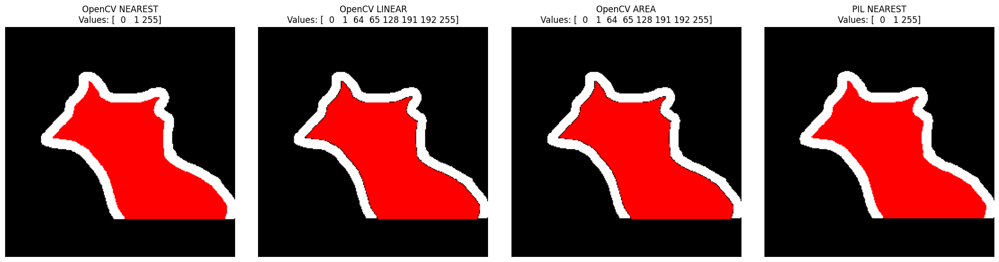

In [24]:
# 4. Test mask resizing methods
# ===========================

def compare_resize_methods(mask, target_size=(256, 256)):
    """Compare different methods of resizing a mask."""
    height, width = mask.shape[:2]
    print(f"Original mask shape: {mask.shape}, unique values: {np.unique(mask)}")
    
    # Method 1: OpenCV INTER_NEAREST
    resized_nearest = cv2.resize(
        mask, target_size, interpolation=cv2.INTER_NEAREST
    )
    
    # Method 2: OpenCV INTER_LINEAR
    resized_linear = cv2.resize(
        mask, target_size, interpolation=cv2.INTER_LINEAR
    )
    
    # Method 3: OpenCV INTER_AREA
    resized_area = cv2.resize(
        mask, target_size, interpolation=cv2.INTER_AREA
    )
    
    # Method 4: PIL resize
    mask_pil = Image.fromarray(mask)
    resized_pil = np.array(mask_pil.resize(target_size, Image.NEAREST))
    
    # Display results
    print(f"Resized to: {target_size}")
    print(f"OpenCV NEAREST - unique values: {np.unique(resized_nearest)}")
    print(f"OpenCV LINEAR - unique values: {np.unique(resized_linear)}")
    print(f"OpenCV AREA - unique values: {np.unique(resized_area)}")
    print(f"PIL NEAREST - unique values: {np.unique(resized_pil)}")
    
    # Show masks
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    
    for ax, img, title in zip(
        axes, 
        [resized_nearest, resized_linear, resized_area, resized_pil],
        ["OpenCV NEAREST", "OpenCV LINEAR", "OpenCV AREA", "PIL NEAREST"]
    ):
        colored_mask = np.zeros((*img.shape, 3), dtype=np.uint8)
        colored_mask[img == 0] = [0, 0, 0]      # Background
        colored_mask[img == 1] = [255, 0, 0]    # Cat
        colored_mask[img == 2] = [0, 255, 0]    # Dog
        colored_mask[img == 255] = [255, 255, 255]  # Border
        
        ax.imshow(colored_mask)
        ax.set_title(f"{title}\nValues: {np.unique(img)}")
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return resized_nearest, resized_linear, resized_area, resized_pil

# Test resize methods on cat mask
if cat_images:
    cat_mask_resized_nearest, cat_mask_resized_linear, cat_mask_resized_area, cat_mask_resized_pil = compare_resize_methods(cat_mask)




===== Testing Augmentations on Cat Image =====
Testing spatial transforms...

HorizontalFlip:
  Original mask values: [  0   1 255]
  Transformed mask values: [  0   1 255]
  Values preserved: True


/tmp/ipykernel_3192043/2749770690.py:11: UserWarning: Argument(s) 'value' are not valid for transform ShiftScaleRotate
  ("ShiftScaleRotate", A.ShiftScaleRotate(
/tmp/ipykernel_3192043/2749770690.py:15: UserWarning: Argument(s) 'alpha_affine' are not valid for transform ElasticTransform
  ("ElasticTransform", A.ElasticTransform(


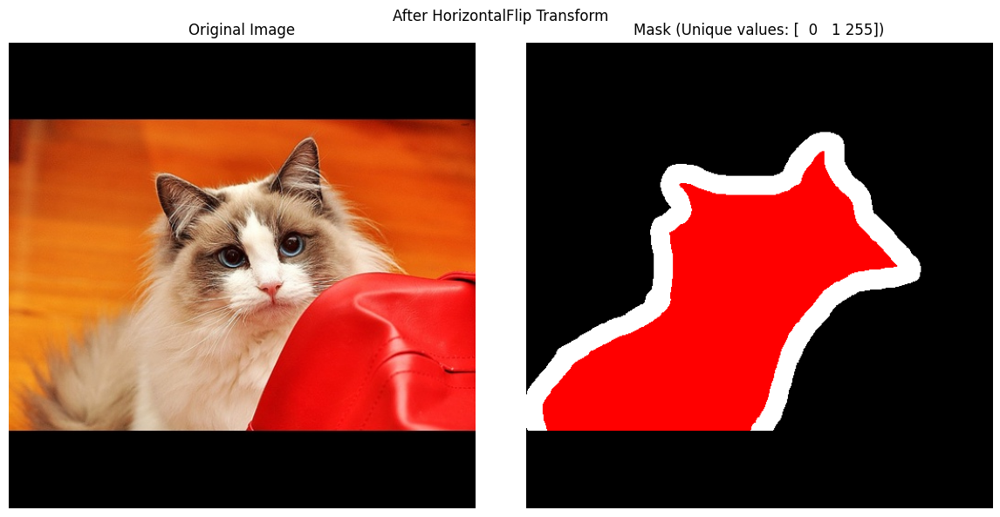

Mask unique values and counts:
  Value 0: 186129 pixels (71.00%)
  Value 1: 54697 pixels (20.87%)
  Value 255: 21318 pixels (8.13%)

VerticalFlip:
  Original mask values: [  0   1 255]
  Transformed mask values: [  0   1 255]
  Values preserved: True


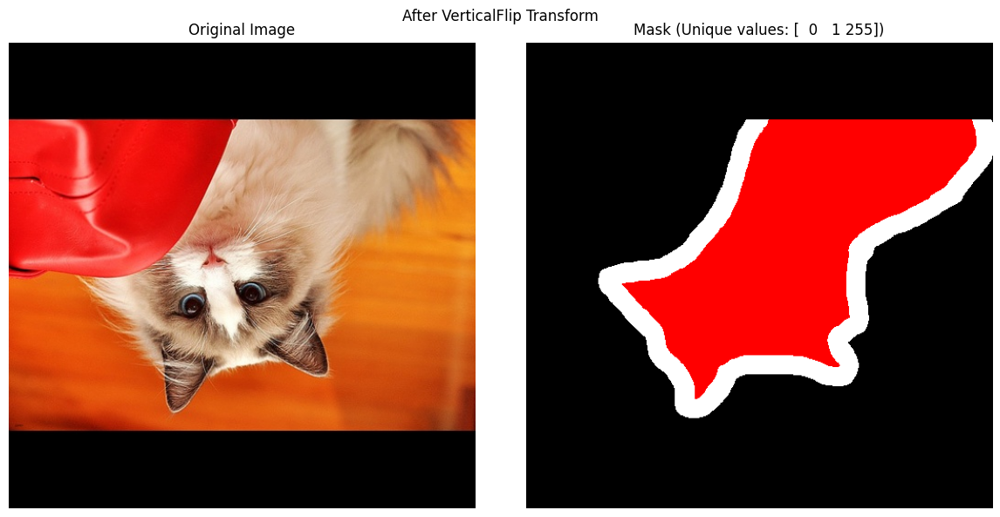

Mask unique values and counts:
  Value 0: 186129 pixels (71.00%)
  Value 1: 54697 pixels (20.87%)
  Value 255: 21318 pixels (8.13%)

Rotate:
  Original mask values: [  0   1 255]
  Transformed mask values: [  0   1 255]
  Values preserved: True


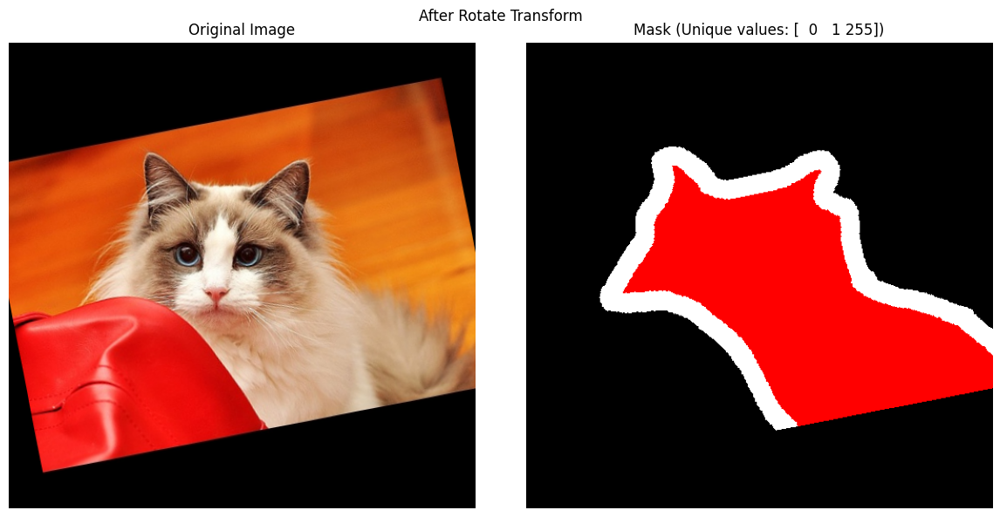

Mask unique values and counts:
  Value 0: 187371 pixels (71.48%)
  Value 1: 54511 pixels (20.79%)
  Value 255: 20262 pixels (7.73%)

ShiftScaleRotate:
  Original mask values: [  0   1 255]
  Transformed mask values: [  0   1 255]
  Values preserved: True


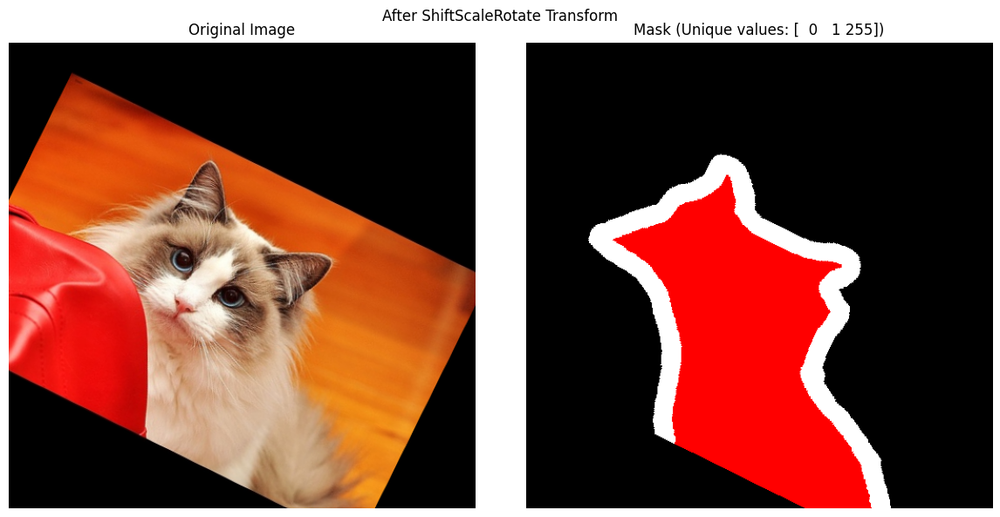

Mask unique values and counts:
  Value 0: 192308 pixels (73.36%)
  Value 1: 50448 pixels (19.24%)
  Value 255: 19388 pixels (7.40%)

ElasticTransform:
  Original mask values: [  0   1 255]
  Transformed mask values: [  0   1 255]
  Values preserved: True


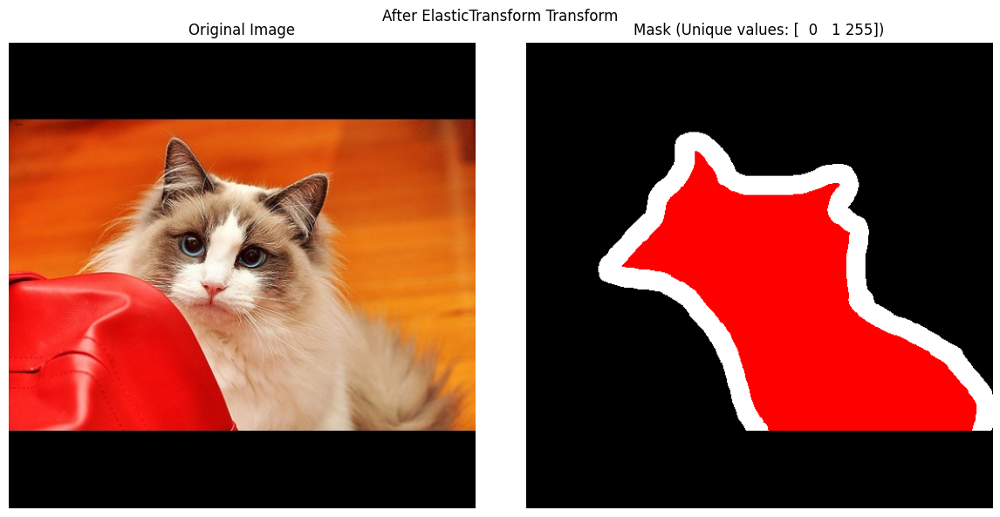

Mask unique values and counts:
  Value 0: 186129 pixels (71.00%)
  Value 1: 54697 pixels (20.87%)
  Value 255: 21318 pixels (8.13%)

GridDistortion:
  Original mask values: [  0   1 255]
  Transformed mask values: [  0   1 255]
  Values preserved: True


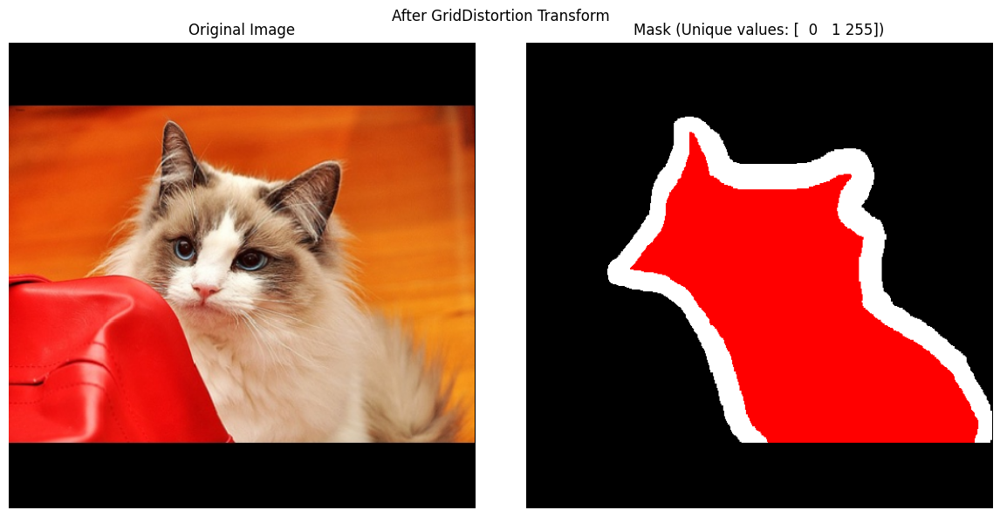

Mask unique values and counts:
  Value 0: 175947 pixels (67.12%)
  Value 1: 62501 pixels (23.84%)
  Value 255: 23696 pixels (9.04%)

OpticalDistortion:
  Original mask values: [  0   1 255]
  Transformed mask values: [  0   1 255]
  Values preserved: True


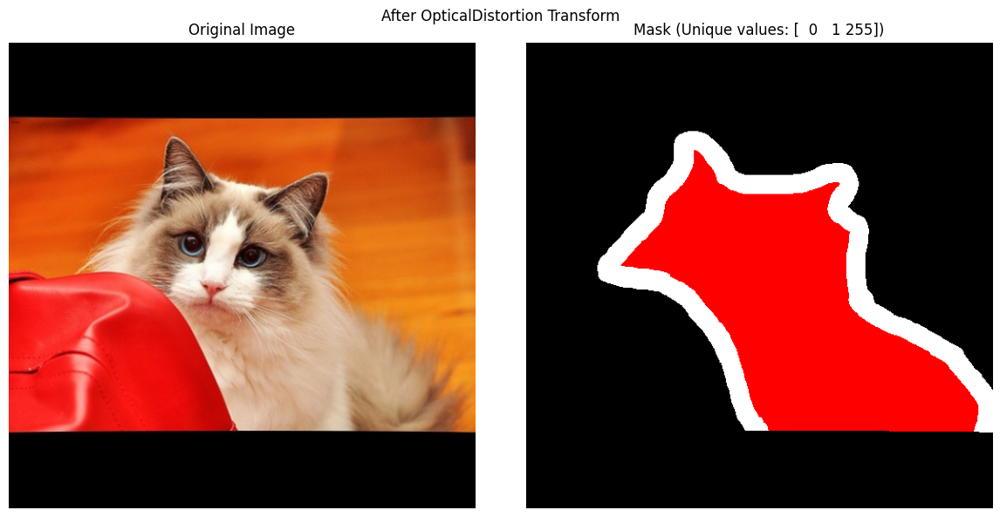

Mask unique values and counts:
  Value 0: 185348 pixels (70.70%)
  Value 1: 55344 pixels (21.11%)
  Value 255: 21452 pixels (8.18%)

Testing pixel transforms (should not affect mask)...

RandomBrightnessContrast:
  Mask unchanged: True


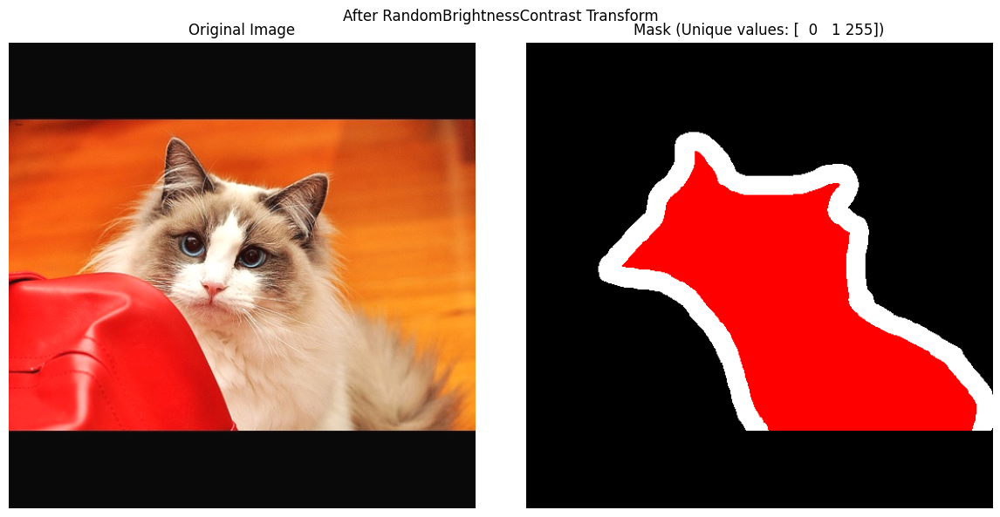

Mask unique values and counts:
  Value 0: 186129 pixels (71.00%)
  Value 1: 54697 pixels (20.87%)
  Value 255: 21318 pixels (8.13%)

HueSaturationValue:
  Mask unchanged: True


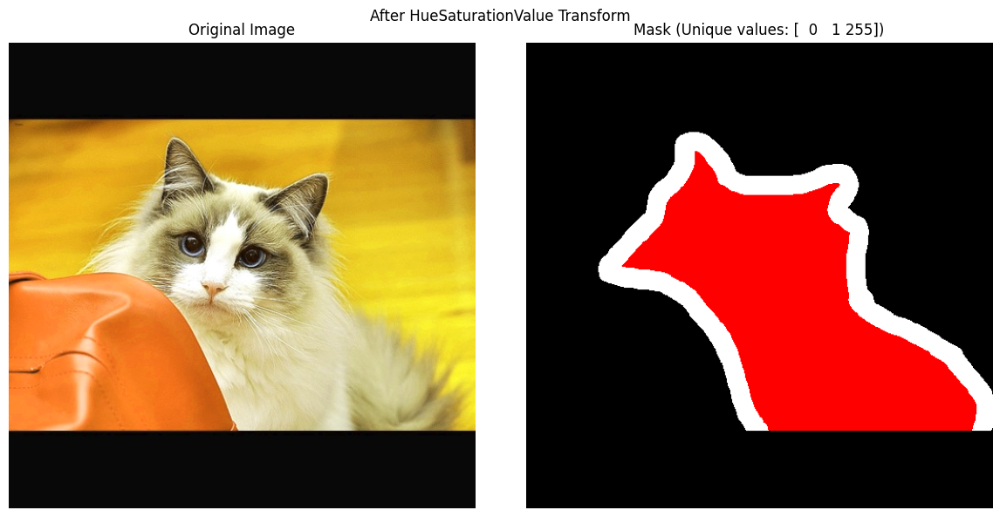

Mask unique values and counts:
  Value 0: 186129 pixels (71.00%)
  Value 1: 54697 pixels (20.87%)
  Value 255: 21318 pixels (8.13%)

RGBShift:
  Mask unchanged: True


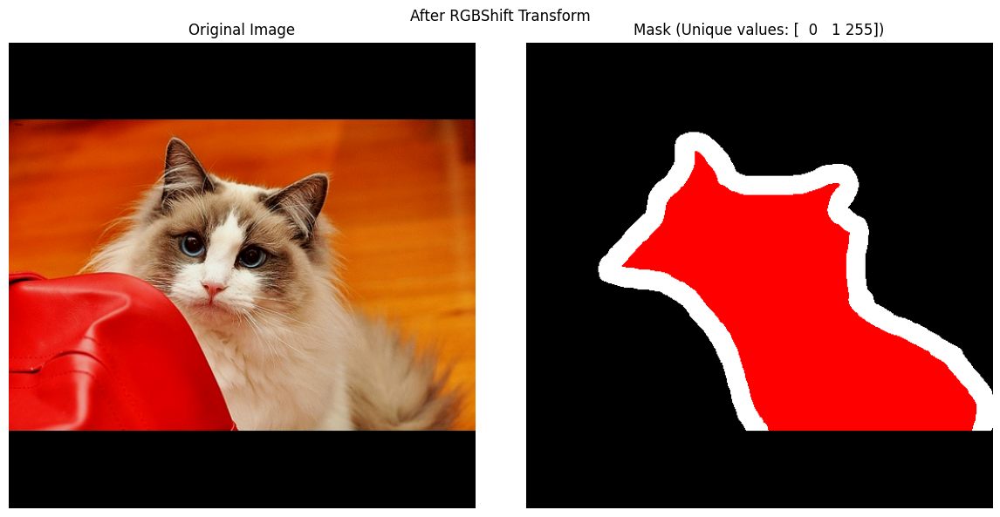

Mask unique values and counts:
  Value 0: 186129 pixels (71.00%)
  Value 1: 54697 pixels (20.87%)
  Value 255: 21318 pixels (8.13%)

GaussNoise:
  Mask unchanged: True


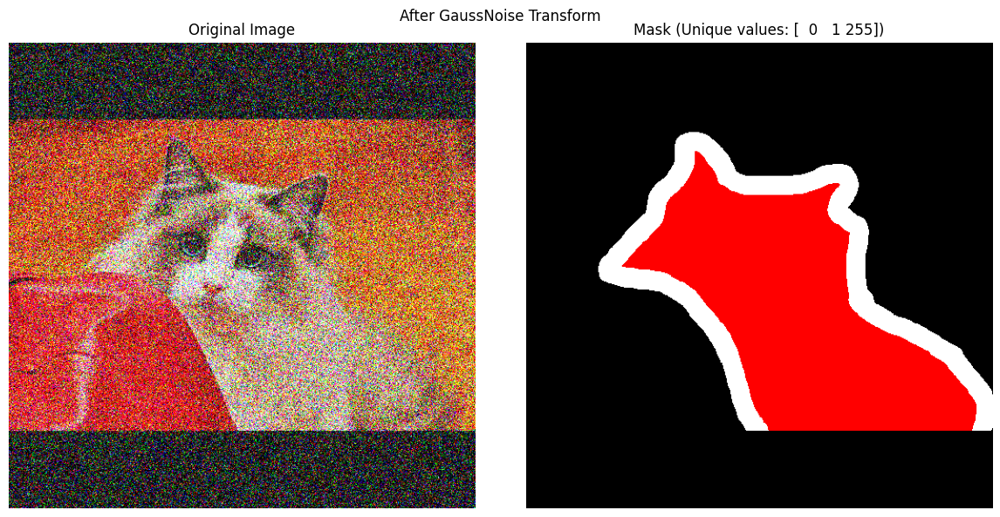

Mask unique values and counts:
  Value 0: 186129 pixels (71.00%)
  Value 1: 54697 pixels (20.87%)
  Value 255: 21318 pixels (8.13%)

GaussianBlur:
  Mask unchanged: True


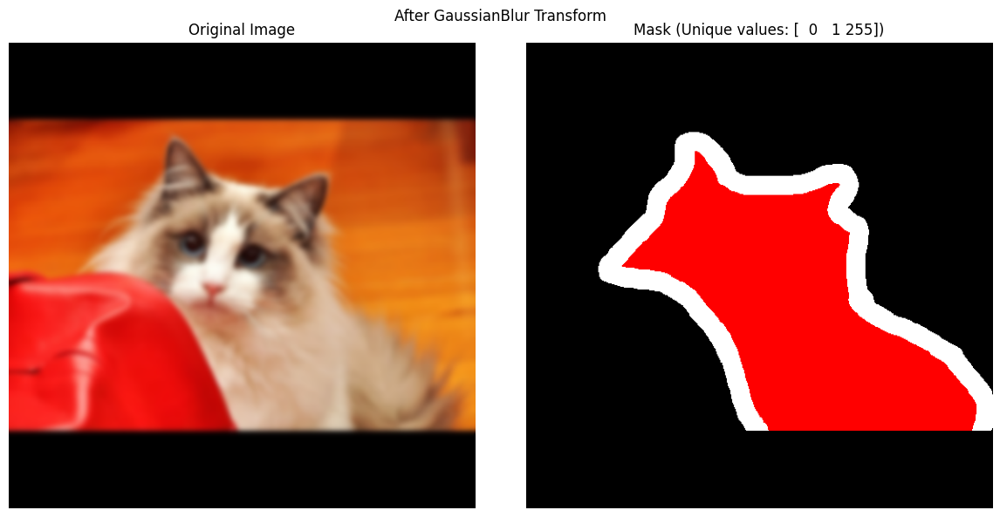

Mask unique values and counts:
  Value 0: 186129 pixels (71.00%)
  Value 1: 54697 pixels (20.87%)
  Value 255: 21318 pixels (8.13%)


In [25]:
# 5. Test Albumentations transforms
# ===============================

def test_augmentations(image, mask):
    """Test different Albumentations transforms and check mask preservation."""
    # Define transforms to test
    spatial_transforms = [
        ("HorizontalFlip", A.HorizontalFlip(p=1.0)),
        ("VerticalFlip", A.VerticalFlip(p=1.0)),
        ("Rotate", A.Rotate(limit=30, p=1.0)),
        ("ShiftScaleRotate", A.ShiftScaleRotate(
            shift_limit=0.1, scale_limit=0.1, rotate_limit=45, 
            p=1.0, border_mode=cv2.BORDER_CONSTANT, value=0
        )),
        ("ElasticTransform", A.ElasticTransform(
            alpha=1, sigma=50, alpha_affine=50, p=1.0
        )),
        ("GridDistortion", A.GridDistortion(p=1.0)),
        ("OpticalDistortion", A.OpticalDistortion(p=1.0))
    ]
    
    pixel_transforms = [
        ("RandomBrightnessContrast", A.RandomBrightnessContrast(p=1.0)),
        ("HueSaturationValue", A.HueSaturationValue(p=1.0)),
        ("RGBShift", A.RGBShift(p=1.0)),
        ("GaussNoise", A.GaussNoise(p=1.0)),
        ("GaussianBlur", A.GaussianBlur(p=1.0))
    ]
    
    # Test spatial transforms
    print("Testing spatial transforms...")
    for name, transform in spatial_transforms:
        try:
            # Apply transform
            transformed = transform(image=image, mask=mask)
            transformed_image = transformed['image']
            transformed_mask = transformed['mask']
            
            # Check mask values
            orig_values = np.unique(mask)
            trans_values = np.unique(transformed_mask)
            
            print(f"\n{name}:")
            print(f"  Original mask values: {orig_values}")
            print(f"  Transformed mask values: {trans_values}")
            print(f"  Values preserved: {set(orig_values) == set(trans_values)}")
            
            # Display result
            display_image_and_mask(
                transformed_image, transformed_mask, 
                f"After {name} Transform"
            )
        except Exception as e:
            print(f"Error with {name}: {e}")
    
    # Test pixel transforms
    print("\nTesting pixel transforms (should not affect mask)...")
    for name, transform in pixel_transforms:
        try:
            # Apply transform
            transformed = transform(image=image, mask=mask)
            transformed_image = transformed['image']
            transformed_mask = transformed['mask']
            
            # Check if mask is unchanged
            mask_unchanged = np.array_equal(mask, transformed_mask)
            
            print(f"\n{name}:")
            print(f"  Mask unchanged: {mask_unchanged}")
            
            # If mask changed (it shouldn't), check where
            if not mask_unchanged:
                diff_locations = np.where(mask != transformed_mask)
                print(f"  Different at {len(diff_locations[0])} pixels")
            
            # Display result
            display_image_and_mask(
                transformed_image, transformed_mask, 
                f"After {name} Transform"
            )
        except Exception as e:
            print(f"Error with {name}: {e}")

# Test augmentations on cat image and mask
if cat_images:
    print("\n===== Testing Augmentations on Cat Image =====")
    test_augmentations(cat_img_rgb, cat_mask)




===== Testing Mask Save/Load =====
Original mask - unique values: [  0   1 255], dtype: uint8
Saved mask to test_mask.png
Reloaded with PIL - unique values: [  0   1 255], dtype: uint8
Reloaded with OpenCV UNCHANGED - unique values: [  0   1 255], dtype: uint8


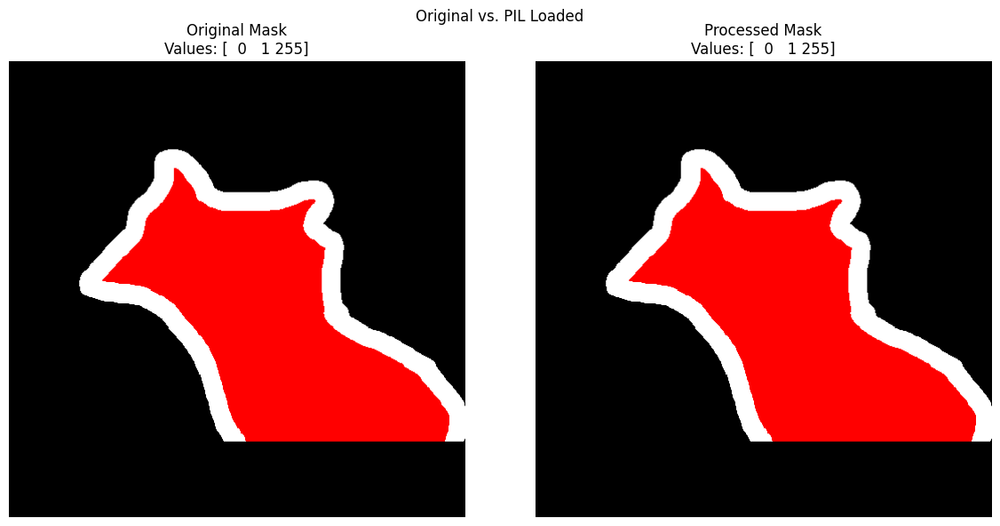

✅ Masks are identical
Removed test file: test_mask.png


In [26]:
# 6. Test mask saving and loading
# =============================

def test_save_load_mask(mask, filename="test_mask.png"):
    """Test saving and loading a mask."""
    print(f"Original mask - unique values: {np.unique(mask)}, dtype: {mask.dtype}")
    
    # Save with PIL
    Image.fromarray(mask).save(filename)
    print(f"Saved mask to {filename}")
    
    # Reload with PIL
    loaded_pil = np.array(Image.open(filename))
    print(f"Reloaded with PIL - unique values: {np.unique(loaded_pil)}, dtype: {loaded_pil.dtype}")
    
    # Reload with OpenCV
    loaded_cv = cv2.imread(filename, cv2.IMREAD_UNCHANGED)
    print(f"Reloaded with OpenCV UNCHANGED - unique values: {np.unique(loaded_cv) if loaded_cv is not None else 'None'}, dtype: {loaded_cv.dtype if loaded_cv is not None else 'None'}")
    
    # Compare original and loaded
    compare_masks(mask, loaded_pil, "Original vs. PIL Loaded")
    
    # Clean up
    try:
        os.remove(filename)
        print(f"Removed test file: {filename}")
    except:
        pass
    
    return loaded_pil, loaded_cv

# Test save/load on cat mask
if cat_images:
    print("\n===== Testing Mask Save/Load =====")
    cat_mask_loaded_pil, cat_mask_loaded_cv = test_save_load_mask(cat_mask)




===== Testing Full Cat Augmentation Pipeline =====
Original mask - unique values: [  0   1 255], dtype: uint8

Augmentation 1:
  Original mask values: [  0   1 255]
  Transformed mask values: [  0   1 255]
  Values preserved: True


/tmp/ipykernel_3192043/896256280.py:15: UserWarning: Argument(s) 'value' are not valid for transform ShiftScaleRotate
  A.ShiftScaleRotate(
/tmp/ipykernel_3192043/896256280.py:28: UserWarning: Argument(s) 'alpha_affine' are not valid for transform ElasticTransform
  A.ElasticTransform(
/tmp/ipykernel_3192043/896256280.py:43: UserWarning: Argument(s) 'shift_limit' are not valid for transform OpticalDistortion
  A.OpticalDistortion(


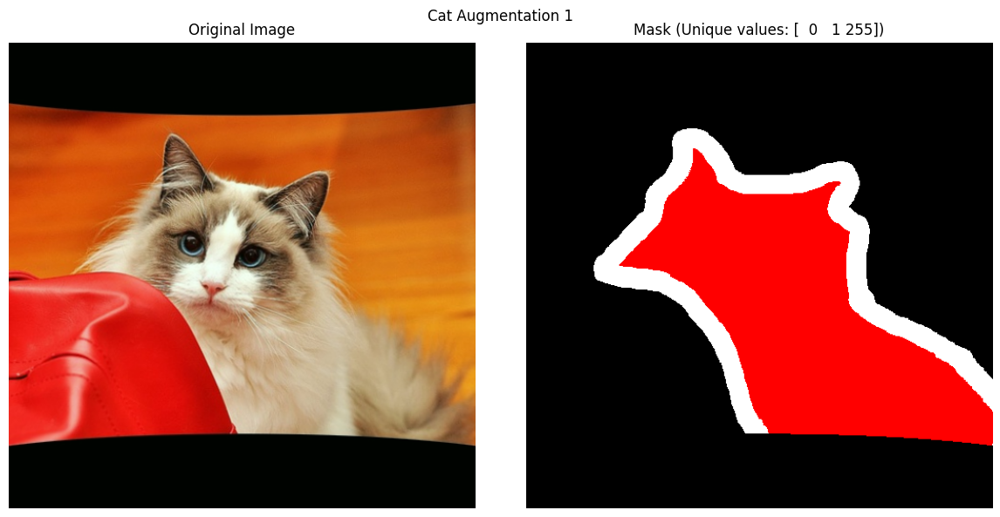

Mask unique values and counts:
  Value 0: 182292 pixels (69.54%)
  Value 1: 58154 pixels (22.18%)
  Value 255: 21698 pixels (8.28%)
  After save/reload values: [  0   1 255]


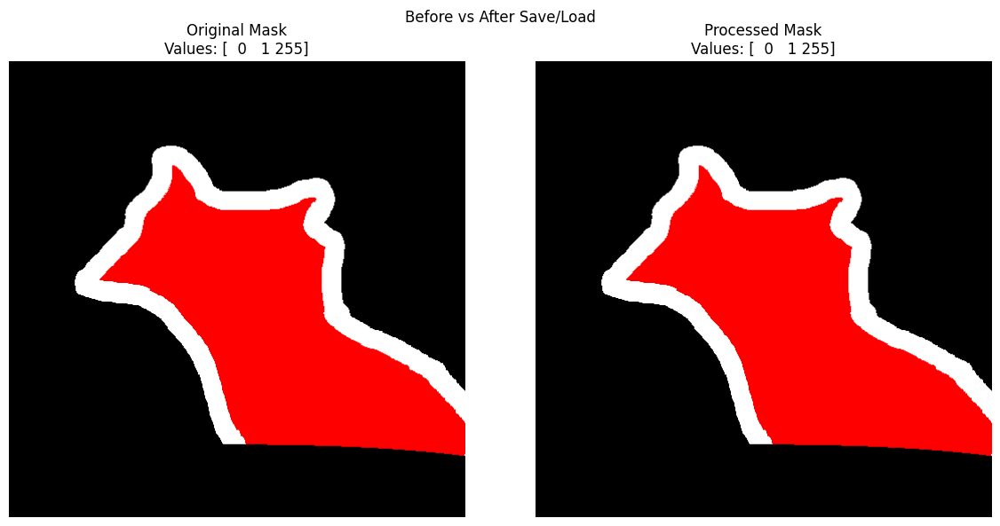

✅ Masks are identical

Augmentation 2:
  Original mask values: [  0   1 255]
  Transformed mask values: [  0   1 255]
  Values preserved: True


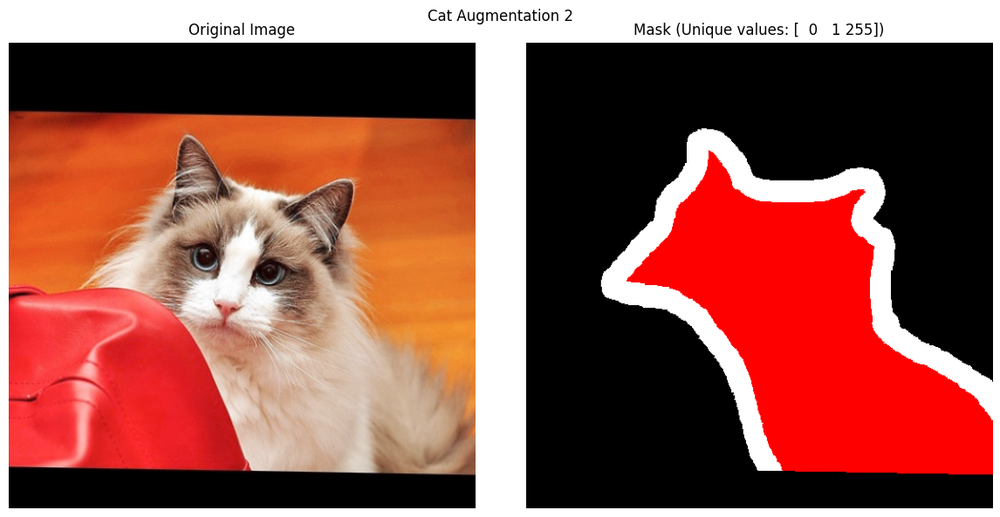

Mask unique values and counts:
  Value 0: 170745 pixels (65.13%)
  Value 1: 67022 pixels (25.57%)
  Value 255: 24377 pixels (9.30%)
  After save/reload values: [  0   1 255]


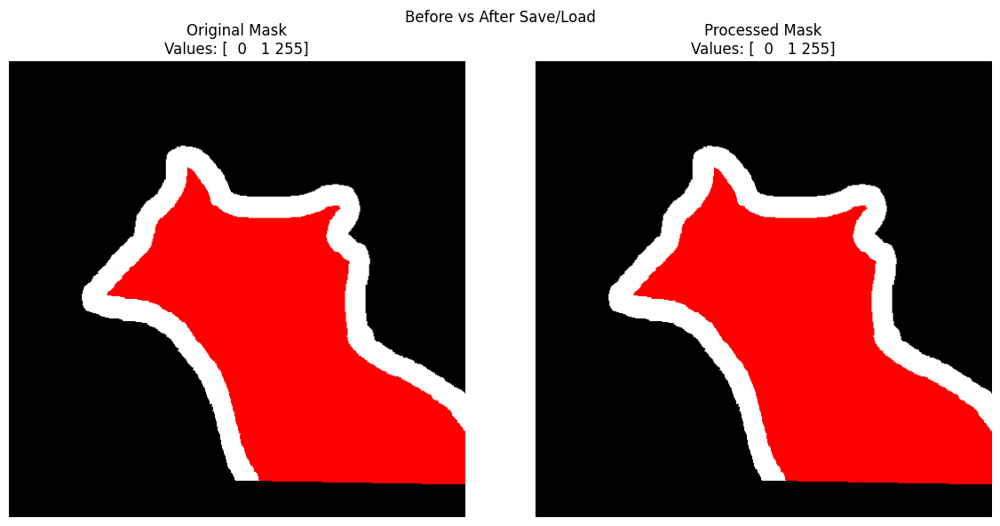

✅ Masks are identical

Augmentation 3:
  Original mask values: [  0   1 255]
  Transformed mask values: [  0   1 255]
  Values preserved: True


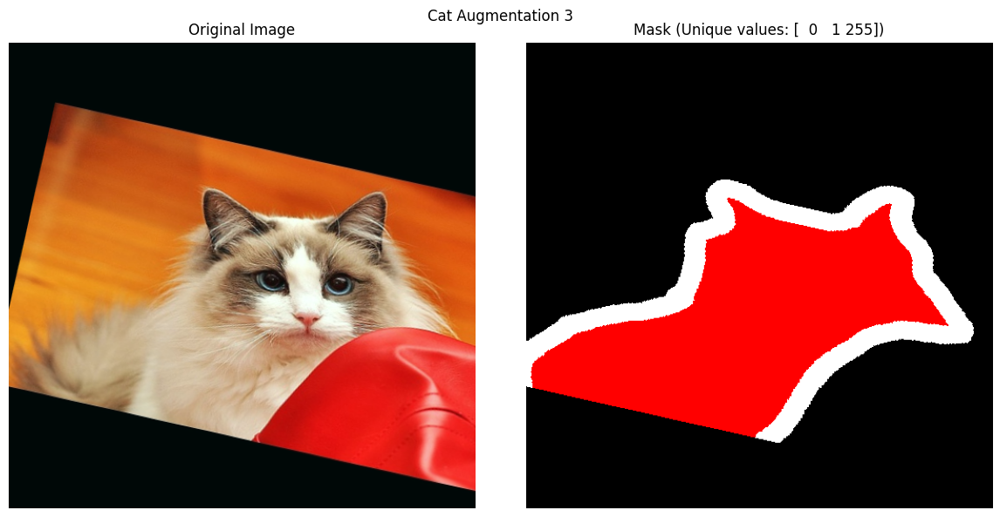

Mask unique values and counts:
  Value 0: 184271 pixels (70.29%)
  Value 1: 56452 pixels (21.53%)
  Value 255: 21421 pixels (8.17%)
  After save/reload values: [  0   1 255]


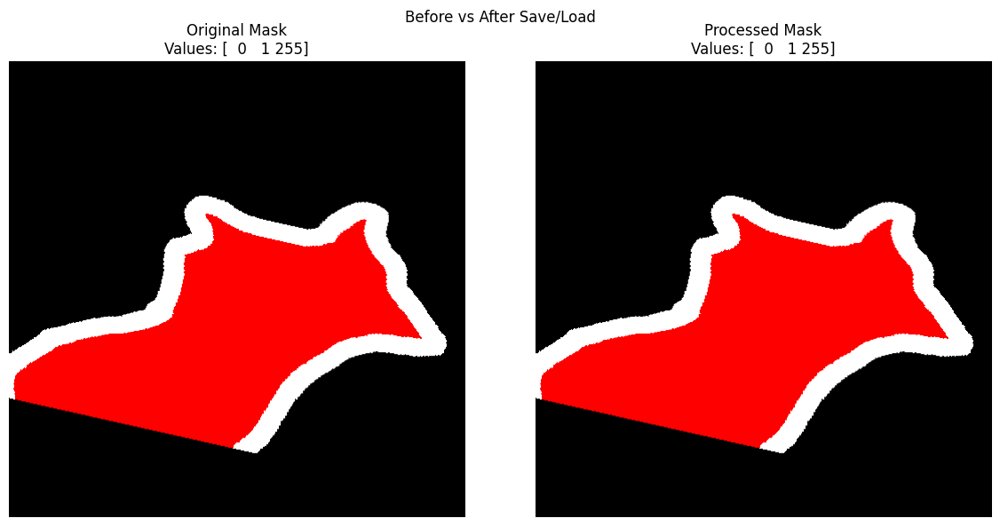

✅ Masks are identical

===== Testing Full Dog Augmentation Pipeline =====
Original mask - unique values: [  0   2 255], dtype: uint8

Augmentation 1:
  Original mask values: [  0   2 255]
  Transformed mask values: [  0   2 255]
  Values preserved: True


/tmp/ipykernel_3192043/896256280.py:78: UserWarning: Argument(s) 'value' are not valid for transform ShiftScaleRotate
  A.ShiftScaleRotate(


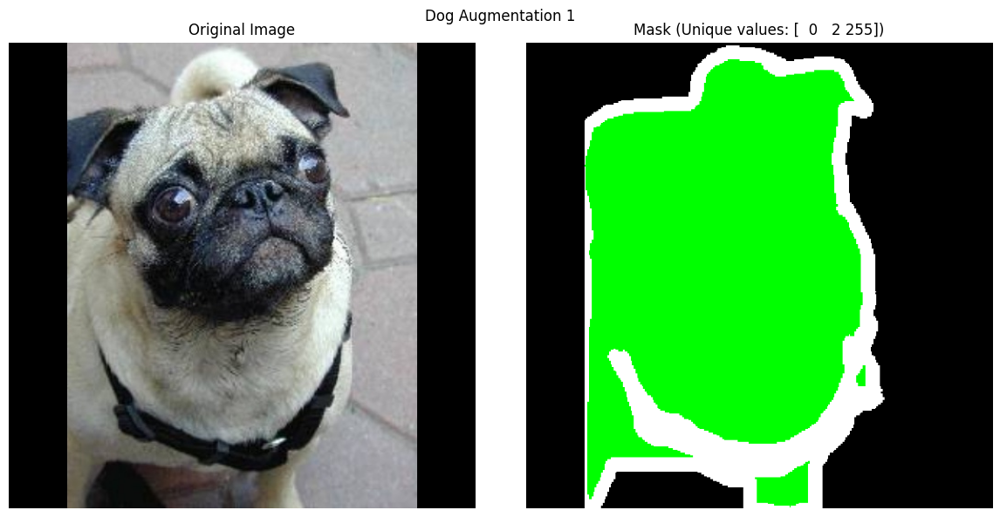

Mask unique values and counts:
  Value 0: 123730 pixels (47.20%)
  Value 2: 107654 pixels (41.07%)
  Value 255: 30760 pixels (11.73%)
  After save/reload values: [  0   2 255]


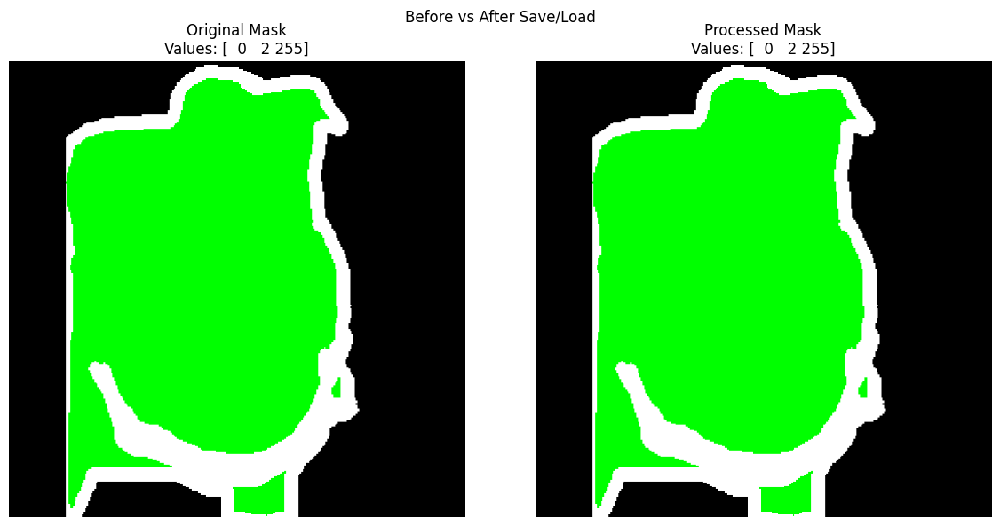

✅ Masks are identical

Augmentation 2:
  Original mask values: [  0   2 255]
  Transformed mask values: [  0   2 255]
  Values preserved: True


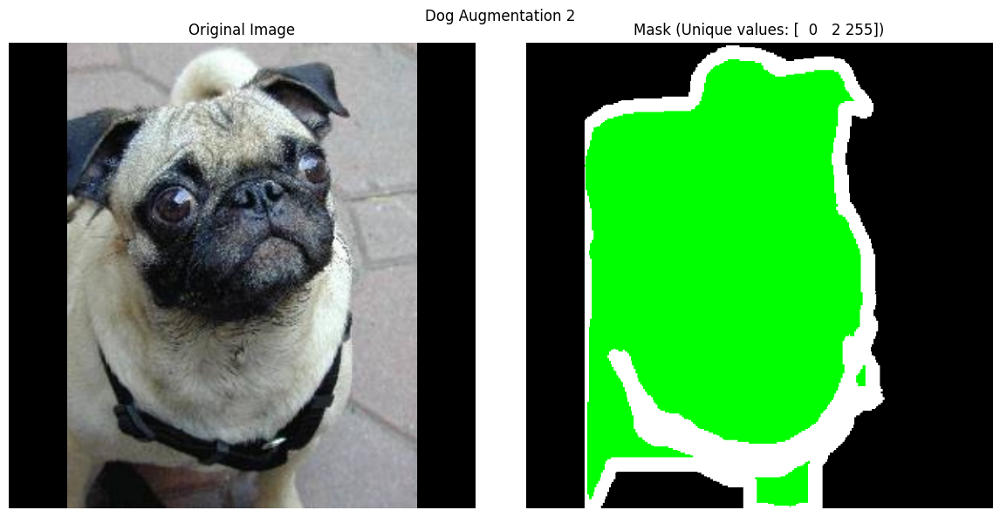

Mask unique values and counts:
  Value 0: 123730 pixels (47.20%)
  Value 2: 107654 pixels (41.07%)
  Value 255: 30760 pixels (11.73%)
  After save/reload values: [  0   2 255]


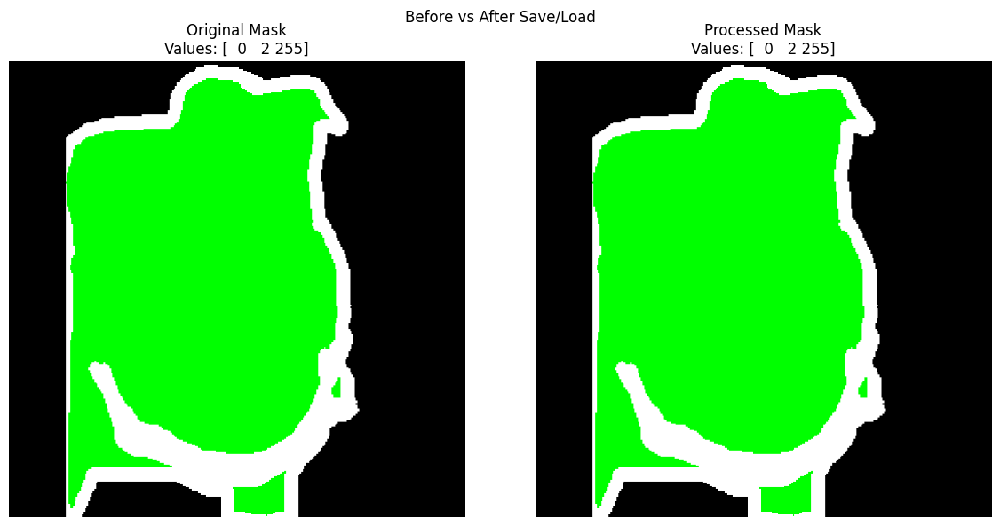

✅ Masks are identical

Augmentation 3:
  Original mask values: [  0   2 255]
  Transformed mask values: [  0   2 255]
  Values preserved: True


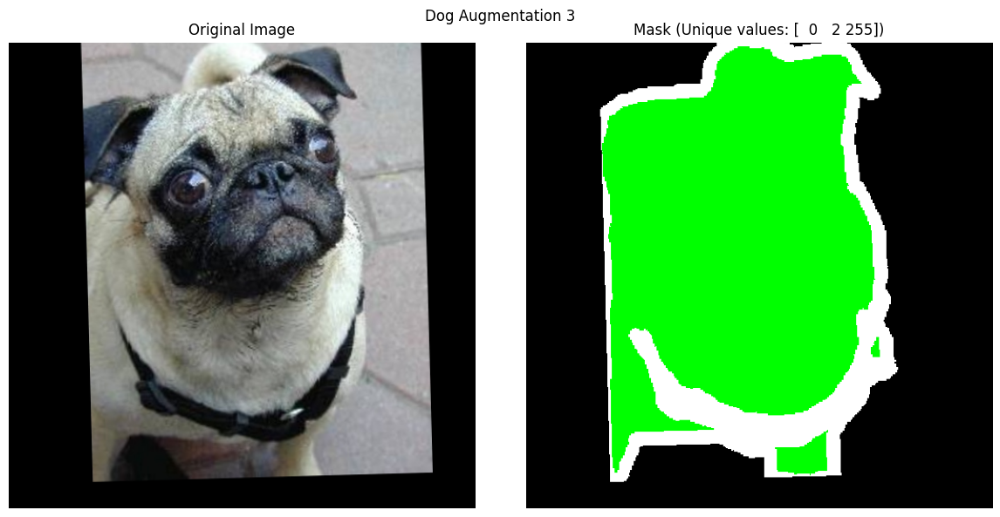

Mask unique values and counts:
  Value 0: 133518 pixels (50.93%)
  Value 2: 100410 pixels (38.30%)
  Value 255: 28216 pixels (10.76%)
  After save/reload values: [  0   2 255]


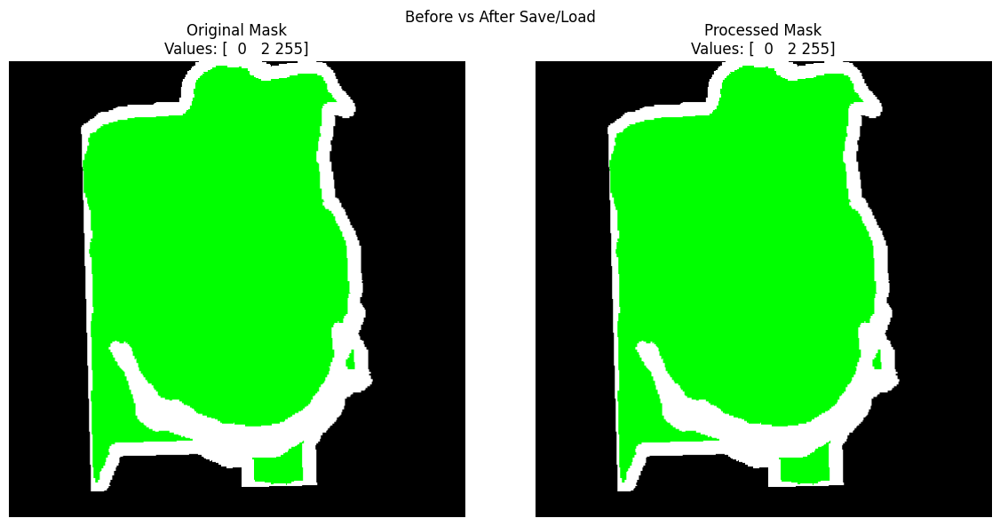

✅ Masks are identical


In [27]:
# 7. Complete augmentation pipeline test
# ====================================

def test_full_pipeline(image, mask, is_cat=True):
    """Test a complete augmentation pipeline similar to the one in your script."""
    print(f"\n===== Testing Full {'Cat' if is_cat else 'Dog'} Augmentation Pipeline =====")
    print(f"Original mask - unique values: {np.unique(mask)}, dtype: {mask.dtype}")
    
    # Create config similar to your YAML configuration
    if is_cat:
        # More aggressive Cat transform
        transform = A.Compose([
            # Spatial Transforms - More aggressive for cats
            A.HorizontalFlip(p=0.5),
            A.ShiftScaleRotate(
                scale_limit=0.15,
                rotate_limit=15,
                shift_limit=0.1,
                p=0.8,
                border_mode=cv2.BORDER_CONSTANT,
                value=0,
                interpolation=cv2.INTER_LINEAR,
                mask_interpolation=cv2.INTER_NEAREST  # Explicitly set mask interpolation
            ),
            
            # Elastic Transforms - Only for cats
            A.OneOf([
                A.ElasticTransform(
                    alpha=40,
                    sigma=4,
                    alpha_affine=15,
                    p=0.6,
                    interpolation=cv2.INTER_LINEAR,
                    mask_interpolation=cv2.INTER_NEAREST
                ),
                A.GridDistortion(
                    num_steps=5,
                    distort_limit=0.2,
                    p=0.5,
                    interpolation=cv2.INTER_LINEAR,
                    mask_interpolation=cv2.INTER_NEAREST
                ),
                A.OpticalDistortion(
                    distort_limit=0.2,
                    shift_limit=0.15,
                    p=0.5,
                    interpolation=cv2.INTER_LINEAR,
                    mask_interpolation=cv2.INTER_NEAREST
                )
            ], p=0.3),
            
            # Pixel-level Transforms - More variety for cats
            A.OneOf([
                A.RandomBrightnessContrast(
                    brightness_limit=0.2,
                    contrast_limit=0.2,
                    p=0.8
                ),
                A.HueSaturationValue(
                    hue_shift_limit=10,
                    sat_shift_limit=30,
                    val_shift_limit=20,
                    p=0.5
                ),
                A.RGBShift(
                    r_shift_limit=15,
                    g_shift_limit=15,
                    b_shift_limit=15,
                    p=0.5
                )
            ], p=0.8)
        ])
    else:
        # More conservative Dog transform
        transform = A.Compose([
            # Spatial Transforms - More conservative for dogs
            A.HorizontalFlip(p=0.5),
            A.ShiftScaleRotate(
                scale_limit=0.1,
                rotate_limit=10,
                shift_limit=0.05,
                p=0.5,
                border_mode=cv2.BORDER_CONSTANT,
                value=0,
                interpolation=cv2.INTER_LINEAR,
                mask_interpolation=cv2.INTER_NEAREST  # Explicitly set mask interpolation
            ),
            
            # Pixel-level Transforms - Less variety for dogs
            A.OneOf([
                A.RandomBrightnessContrast(
                    brightness_limit=0.15,
                    contrast_limit=0.15,
                    p=0.7
                ),
                A.HueSaturationValue(
                    hue_shift_limit=5,
                    sat_shift_limit=20,
                    val_shift_limit=15,
                    p=0.4
                ),
            ], p=0.6)
        ])
    
    # Apply augmentation 3 times
    for i in range(3):
        # Ensure mask is uint8
        mask_uint8 = mask.astype(np.uint8)
        
        # Apply transform
        transformed = transform(image=image, mask=mask_uint8)
        transformed_image = transformed['image']
        transformed_mask = transformed['mask']
        
        # Check mask values
        print(f"\nAugmentation {i+1}:")
        print(f"  Original mask values: {np.unique(mask_uint8)}")
        print(f"  Transformed mask values: {np.unique(transformed_mask)}")
        print(f"  Values preserved: {set(np.unique(mask_uint8)) == set(np.unique(transformed_mask))}")
        
        # Display result
        display_image_and_mask(
            transformed_image, transformed_mask, 
            f"{'Cat' if is_cat else 'Dog'} Augmentation {i+1}"
        )
        
        # Test save and reload
        test_filename = f"test_{'cat' if is_cat else 'dog'}_aug{i+1}.png"
        Image.fromarray(transformed_mask).save(test_filename)
        loaded_mask = np.array(Image.open(test_filename))
        
        print(f"  After save/reload values: {np.unique(loaded_mask)}")
        compare_masks(transformed_mask, loaded_mask, "Before vs After Save/Load")
        
        # Clean up
        try:
            os.remove(test_filename)
        except:
            pass

# Test full pipeline on cat image
if cat_images:
    test_full_pipeline(cat_img_rgb, cat_mask, is_cat=True)

# Test full pipeline on dog image
if dog_images:
    test_full_pipeline(dog_img_rgb, dog_mask, is_cat=False)




===== Testing Resize with Padding =====
Original image shape: (512, 512, 3), mask shape: (512, 512)
Resized image shape: (512, 512, 3)
Resized mask shape: (512, 512)
Original mask values: [  0   1 255]
Resized mask values: [  0   1 255]


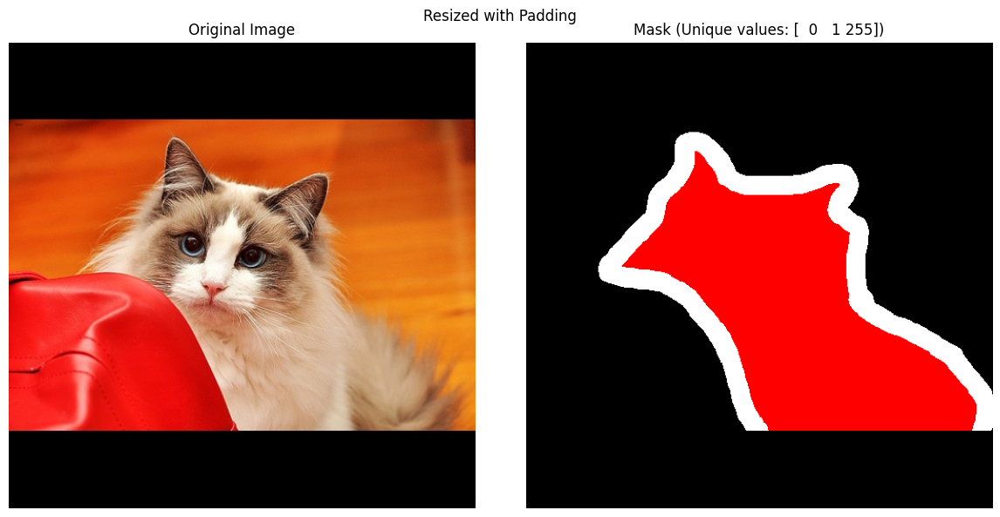

Mask unique values and counts:
  Value 0: 186129 pixels (71.00%)
  Value 1: 54697 pixels (20.87%)
  Value 255: 21318 pixels (8.13%)


In [28]:
# 8. Aspect-preserving resize with padding test
# ==========================================

def test_resize_with_padding(image, mask, target_size=512):
    """Test the resize_image_with_padding function from your script."""
    print(f"\n===== Testing Resize with Padding =====")
    print(f"Original image shape: {image.shape}, mask shape: {mask.shape}")
    
    # Resize image with padding
    def resize_image_with_padding(img, target_size):
        height, width = img.shape[:2]
        
        # Calculate target dimensions preserving aspect ratio
        if height > width:
            # Portrait orientation
            scale = target_size / height
            new_height = target_size
            new_width = int(width * scale)
        else:
            # Landscape or square orientation
            scale = target_size / width
            new_width = target_size
            new_height = int(height * scale)
        
        # Resize image
        resized = cv2.resize(img, (new_width, new_height))
        
        # Create a square canvas with black background
        channels = img.shape[2] if len(img.shape) == 3 else 1
        if channels > 1:
            padded = np.zeros((target_size, target_size, channels), dtype=np.uint8)
        else:
            padded = np.zeros((target_size, target_size), dtype=np.uint8)
        
        # Calculate padding offsets to center the image
        pad_y = (target_size - new_height) // 2
        pad_x = (target_size - new_width) // 2
        
        # Place the resized image on the padded canvas
        if channels > 1:
            padded[pad_y:pad_y+new_height, pad_x:pad_x+new_width, :] = resized
        else:
            padded[pad_y:pad_y+new_height, pad_x:pad_x+new_width] = resized
        
        return padded
    
    # Resize both image and mask
    resized_image = resize_image_with_padding(image, target_size)
    
    # Use INTER_NEAREST for mask to preserve label values
    height, width = mask.shape[:2]
    if height > width:
        scale = target_size / height
        new_height = target_size
        new_width = int(width * scale)
    else:
        scale = target_size / width
        new_width = target_size
        new_height = int(height * scale)
    
    # Resize mask using INTER_NEAREST
    resized_mask_temp = cv2.resize(
        mask, (new_width, new_height),
        interpolation=cv2.INTER_NEAREST
    )
    
    # Create padded mask
    padded_mask = np.zeros((target_size, target_size), dtype=np.uint8)
    pad_y = (target_size - new_height) // 2
    pad_x = (target_size - new_width) // 2
    padded_mask[pad_y:pad_y+new_height, pad_x:pad_x+new_width] = resized_mask_temp
    
    # Print results
    print(f"Resized image shape: {resized_image.shape}")
    print(f"Resized mask shape: {padded_mask.shape}")
    print(f"Original mask values: {np.unique(mask)}")
    print(f"Resized mask values: {np.unique(padded_mask)}")
    
    # Display
    display_image_and_mask(resized_image, padded_mask, "Resized with Padding")
    
    return resized_image, padded_mask

# Test resize with padding
if cat_images:
    resized_cat_img, resized_cat_mask = test_resize_with_padding(cat_img_rgb, cat_mask)